In [216]:
%matplotlib inline
import importlib
import utils2; importlib.reload(utils2)
from utils2 import *

from scipy.optimize import fmin_l_bfgs_b
from scipy.misc import imsave
from keras import metrics

from vgg16_avg import VGG16_Avg


In [217]:
limit_mem()

In [3]:
%pwd

'/home/ubuntu/courses/deeplearning2'

In [98]:
current_dir = os.getcwd()
path = current_dir + '/data/ls8NeuralTrans/'

In [27]:
#fnames = glob.glob(path +'**/*.JPEG',recursive=True)
#n = len(fnames);n

19439

In [69]:
#fn = fnames[63]; fn

'/home/ubuntu/courses/deeplearning2/data/ls8NeuralTrans/train/n12144580/n12144580_39862.JPEG'

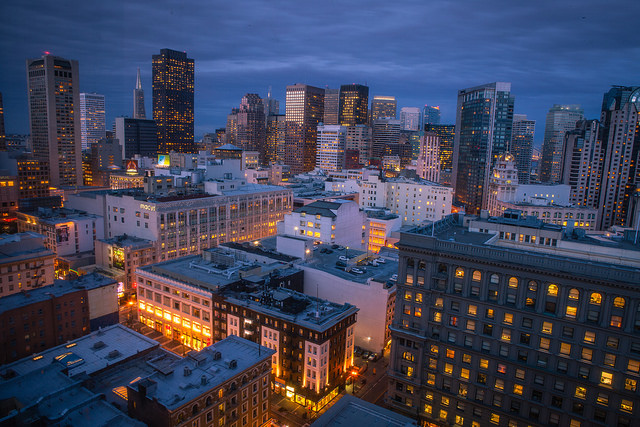

In [218]:
#img = Image.open(path + 'bird.png'); img
img = Image.open(path + 'sanfrancisco.jpg'); img

In [242]:
#img = Image.open(path + 'Goku_Dragon_Ball_Z.png'); img
#img_final = imagg[:,:,:3]

In [219]:
rn_mean = np.array([123.68, 116.779, 103.939], dtype=np.float32)
preproc = lambda x: (x - rn_mean)[:, :, :,::-1]

In [220]:
deproc = lambda x,s: np.clip(x.reshape(s)[:, :, :, ::-1] + rn_mean, 0, 255)

In [221]:
img_arr = preproc(np.expand_dims(np.array(img),0))


In [222]:
shp = img_arr.shape

In [223]:
shp

(1, 427, 640, 3)

### Creating Model for Neural Transfer

In [250]:
model = VGG16_Avg(include_top=False)

/home/ubuntu/courses/deeplearning2/vgg16_avg.py:49: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", name="block1_conv1", padding="same")`
  x = Convolution2D(64, 3, 3, activation='relu', border_mode='same', name='block1_conv1')(img_input)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:50: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", name="block1_conv2", padding="same")`
  x = Convolution2D(64, 3, 3, activation='relu', border_mode='same', name='block1_conv2')(x)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:54: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), activation="relu", name="block2_conv1", padding="same")`
  x = Convolution2D(128, 3, 3, activation='relu', border_mode='same', name='block2_conv1')(x)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:55: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), activation="rel

In [185]:
layer = model.get_layer('block5_conv1').output

In [186]:
layer_model = Model(model.input,layer)

In [187]:
targ = K.variable(layer_model.predict(img_arr))

In [121]:
class Evaluator(object):
    def __init__(self, f, shp): self.f, self.shp = f, shp
        
    def loss(self, x):
        loss_, self.grad_values = self.f([x.reshape(self.shp)])
        return loss_.astype(np.float64)

    def grads(self, x): return self.grad_values.flatten().astype(np.float64)

In [189]:
loss = K.mean(metrics.mse(layer, targ))
grads = K.gradients(loss,model.input)
fn = K.function([model.input],[loss]+grads)
evaluator = Evaluator(fn,shp)


In [155]:
def solve_image(eval_obj,niter,x):
    for i in range(niter):
        x,min_val,info = fmin_l_bfgs_b(eval_obj.loss,x.flatten(),fprime =eval_obj.grads,maxfun=20)
        x = np.clip(x,-127,127)
        print("Current loss value:", min_val)
        imsave(f'{path}/results/lady_res_at_iteration_{i}.png', deproc(x.copy(), shp)[0])
    return x

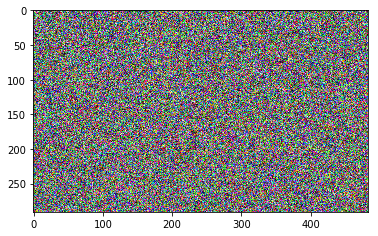

In [116]:
rand_img = lambda shape: np.random.uniform(0, 255, shape)/100
x = rand_img(shp)
plt.imshow(x[0]);

In [549]:
iterations=2

In [550]:
solve_image(evaluator,iterations,x)

Current loss value: 42.522518158


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  


Current loss value: 18.1227283478


array([ -0.95796084,   1.24413432,  -0.36200059,   1.70896589,
         4.1376527 ,  -0.7849555 ,   8.40132529,  17.41661163,
         4.86146187,  13.62383227,  26.758622  ,  12.74257501,
        11.43117813,  26.00144072,   7.66130624,   8.37979836,
        23.09098365,   6.65471283,   6.77758768,  21.93723558, ...,
        -2.15932945,   4.75053242,   1.10490893,  -2.59787599,
         3.3362907 ,   0.86383669,  -2.26821039,   3.39183473,
         1.95487151,  -2.61180203,   2.8788745 ,   0.08870794,
        -0.40636498,   2.01328658,   1.84431723,   0.40111492,
         1.46177318,   2.12382592,   0.9342649 ,   1.40508884])

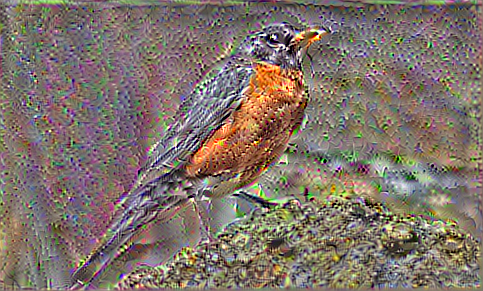

In [358]:
Image.open(path + 'results/res_at_iteration_19.png')

In [153]:
from IPython.display import HTML
from matplotlib import animation,rc

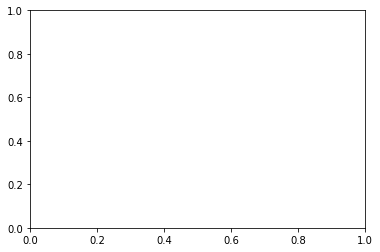

In [154]:
fig,ax = plt.subplots()

In [155]:
def animate(i):
    ax.imshow(Image.open(path + 'results/res_at_iteration_{i}.png'))

In [156]:
anim = animation.FuncAnimation(fig, animate, frames=10, interval=200)
HTML(anim.to_html5_video())

KeyError: 'ffmpeg'

## Recreate Style

In [105]:
def plot_arr(arr): plt.imshow(deproc(arr,arr.shape)[0].astype('uint8'))

In [106]:
style = Image.open(path + 'starry_night.jpg')

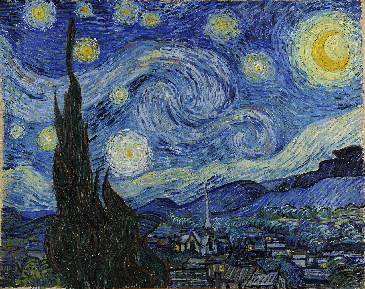

In [107]:
style = style.resize(np.divide(style.size,3.5).astype('int32')); style

In [ ]:
#http://ec2-54-69-170-147.us-west-2.compute.amazonaws.com:8888/view/courses/deeplearning2/data/ls8NeuralTrans/6c9b3a50937c149ca506f1ea5730c226.jpg

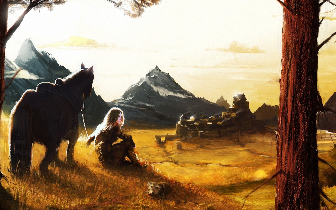

In [154]:
style = Image.open(path + '6c9b3a50937c149ca506f1ea5730c226.jpg')
style = style.resize(np.divide(style.size,5).astype('int32')); style

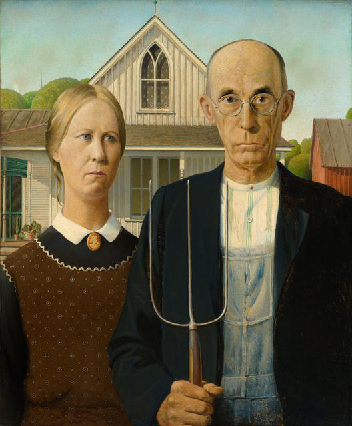

In [240]:
style = Image.open(path + 'american_gothic.jpg')
style = style.resize(np.divide(style.size,1.5).astype('int32'));
style

In [241]:
np.array(style).shape

(426, 352, 3)

In [242]:
style_arr = preproc(np.expand_dims(style,0)[:,:,:,:3])

In [243]:
shp=style_arr.shape;shp


(1, 426, 352, 3)

In [244]:
model = VGG16_Avg(include_top=False, input_shape=shp[1:])

/home/ubuntu/courses/deeplearning2/vgg16_avg.py:49: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", name="block1_conv1", padding="same")`
  x = Convolution2D(64, 3, 3, activation='relu', border_mode='same', name='block1_conv1')(img_input)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:50: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), activation="relu", name="block1_conv2", padding="same")`
  x = Convolution2D(64, 3, 3, activation='relu', border_mode='same', name='block1_conv2')(x)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:54: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), activation="relu", name="block2_conv1", padding="same")`
  x = Convolution2D(128, 3, 3, activation='relu', border_mode='same', name='block2_conv1')(x)
/home/ubuntu/courses/deeplearning2/vgg16_avg.py:55: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), activation="rel

In [245]:
outputs = {l.name : l.output for l in model.layers}

In [212]:
layers = [outputs['block{}_conv1'.format(o)] for o in range(1,3)]
#layers  = model.get_layer('block5_conv1').output

In [213]:
layers_model= Model(model.input,layers)

In [214]:
targs = [K.variable(o) for o in layers_model.predict(style_arr)]
#targs = K.variable(layers_model.predict(style_arr))

In [232]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x,(2,0,1)))
    return K.dot(features , K.transpose(features))/  x.get_shape().num_elements()

In [233]:
def style_loss(x,targ): return K.mean(metrics.mse(gram_matrix(x),gram_matrix(targ)))

In [217]:
loss = sum(style_loss(l1[0], l2[0]) for l1,l2 in zip(layers,targs))
#loss = K.mean(metrics.mse(layers, targs))
grads = K.gradients(loss, model.input)
style_fn = K.function([model.input], [loss]+ grads) 
evaluator = Evaluator(style_fn, shp)

In [124]:
rand_img = lambda shape: np.random.uniform(0,255, shape)/100
x = rand_img(shp)
x = scipy.ndimage.filters.gaussian_filter(x, [0,2,2,0])

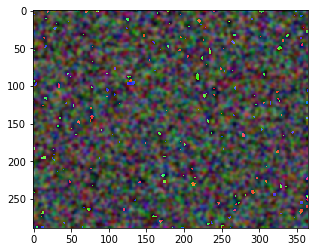

In [132]:
plt.imshow(x[0]);

In [21]:
iterations=10
#x = rand_img(shp)

In [22]:
x.shape

(1, 289, 365, 3)

In [38]:
solve_image(evaluator, iterations, x)

Current loss value: 6013.26806641


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  


Current loss value: 275.956542969
Current loss value: 96.8021697998
Current loss value: 62.5514335632
Current loss value: 41.9961166382
Current loss value: 27.4632568359
Current loss value: 17.8309688568
Current loss value: 10.5172891617
Current loss value: 7.06617307663
Current loss value: 5.44984436035


array([  1.86485335,  -9.32982083, -36.85066856,  43.24877069,
        17.51531905, -18.12052519,  64.83669638,  22.14441481,
        -3.95210944,  87.5040605 ,  46.48451464,  24.70050716,
        81.12120339,  50.97962569,  24.64581028,  62.81978309,
        37.39969087,  12.46831075,  52.71994581,  24.06023174, ...,
       -39.20330683, -44.54043157, -28.91350712, -40.79760882,
       -42.64095951, -31.46290798, -50.87359479, -44.03150603,
        -8.61328656, -17.19744559, -22.66134011,  -0.99763096,
        -8.8785125 , -22.91200829,  -8.06714209, -10.73490309,
       -30.83230956,  18.70345534,  23.42369083,   8.57704509])

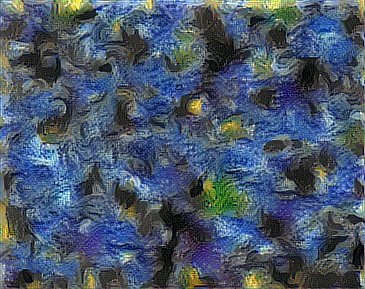

In [39]:
Image.open(path + 'results/res_at_iteration_9.png')

### Style Transfer

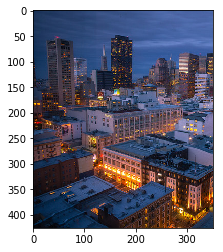

In [246]:
w,h = style.size
src = img_arr[:,:h,:w]
plot_arr(src)

In [212]:
w,h

(528, 640)

In [247]:
style_layer = [outputs['block{}_conv2'.format(o)] for o in range(1,6)]
content = 'block4_conv2'
content_layer = outputs[content]

In [248]:
style_model = Model(model.input,style_layer)
style_targs =[K.variable(o) for o in style_model.predict(style_arr)]

In [249]:
content_model = Model(model.input,content_layer)
content_targs = K.variable(content_model.predict(src))

In [262]:
style_wgts = [0.05,0.2,0.2,0.35,0.2]

In [265]:
loss = sum(style_loss(l1[0],l2[0])*w for l1,l2,w in zip(style_layer, style_targs, style_wgts))
loss += K.mean(metrics.mse(content_layer,content_targs))/10
grads = K.gradients(loss,model.input)
transfer_fn = K.function([model.input],[loss] + grads)

In [266]:
evaluator = Evaluator(transfer_fn,shp)

In [267]:
iterations=20
x = rand_img(shp)

In [268]:
x = solve_image(evaluator,iterations,x)

Current loss value: 4942.02050781


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
  


Current loss value: 2627.0222168
Current loss value: 1429.59631348
Current loss value: 801.498779297
Current loss value: 596.077392578
Current loss value: 488.20135498
Current loss value: 418.636291504
Current loss value: 378.567260742
Current loss value: 345.816802979
Current loss value: 323.124938965
Current loss value: 306.016265869
Current loss value: 292.964782715
Current loss value: 282.875244141
Current loss value: 274.633605957
Current loss value: 267.699371338
Current loss value: 261.595214844
Current loss value: 256.215667725
Current loss value: 251.582641602
Current loss value: 247.26864624
Current loss value: 243.288787842


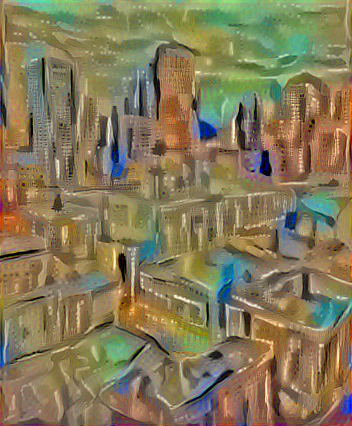

In [269]:
Image.open(path + 'results/lady_res_at_iteration_1.png')

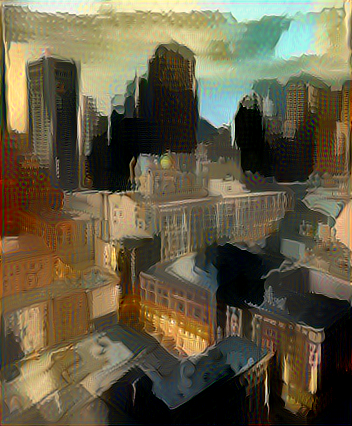

In [270]:
Image.open(path + 'results/lady_res_at_iteration_9.png')

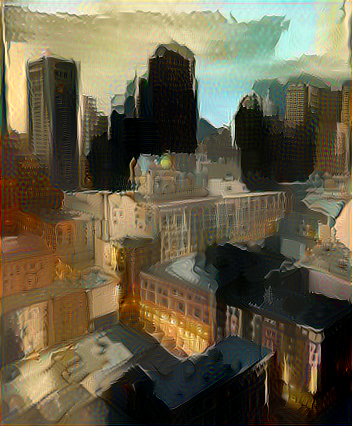

In [271]:
Image.open(path + 'results/lady_res_at_iteration_19.png')

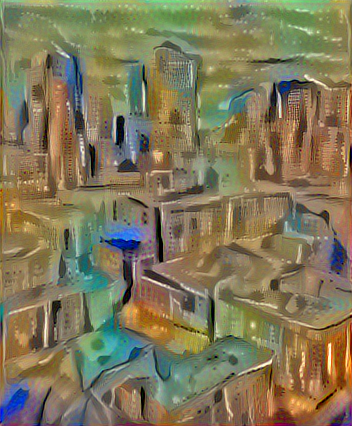

In [255]:
Image.open(path + 'results/lady_res_at_iteration_1.png')

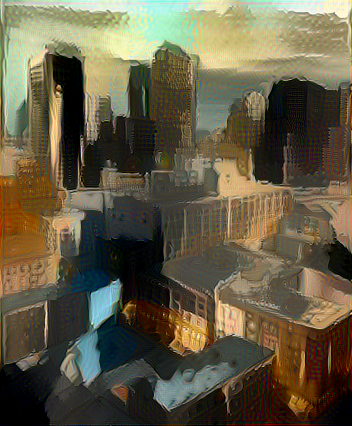

In [256]:
Image.open(path + 'results/lady_res_at_iteration_9.png')

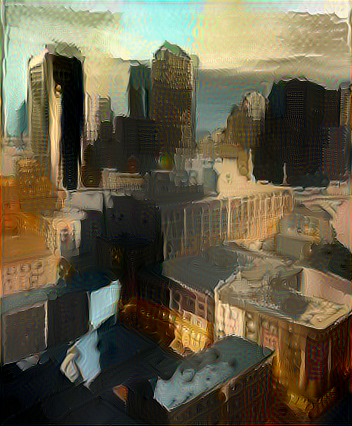

In [257]:
Image.open(path + 'results/lady_res_at_iteration_19.png')

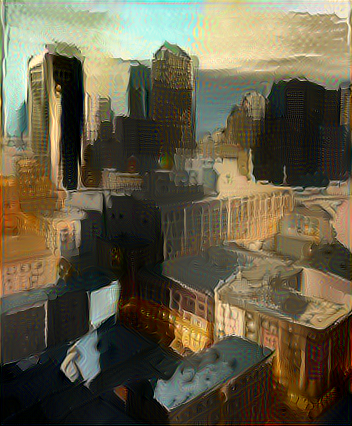

In [258]:
Image.open(path + 'results/lady_res_at_iteration_29.png')

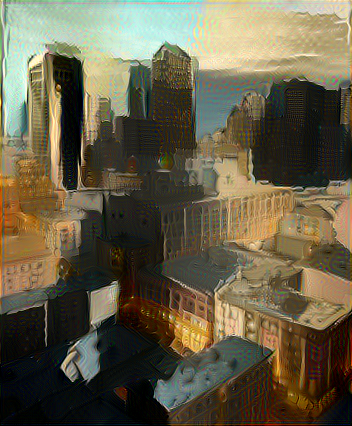

In [259]:
Image.open(path + 'results/lady_res_at_iteration_59.png')

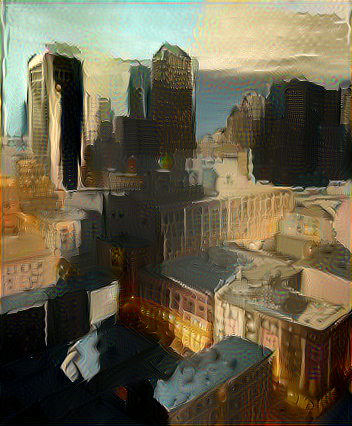

In [260]:
Image.open(path + 'results/lady_res_at_iteration_89.png')

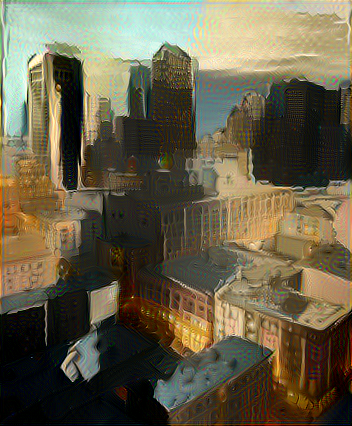

In [261]:
Image.open(path + 'results/lady_res_at_iteration_99.png')

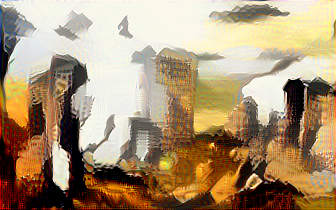

In [178]:
Image.open(path + 'results/lady_res_at_iteration_9.png')

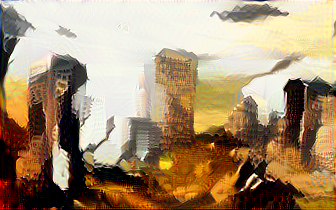

In [179]:
Image.open(path + 'results/lady_res_at_iteration_19.png')

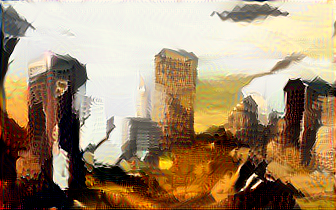

In [180]:
Image.open(path + 'results/lady_res_at_iteration_29.png')

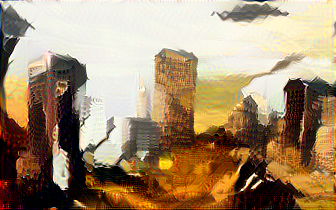

In [181]:
Image.open(path + 'results/lady_res_at_iteration_39.png')

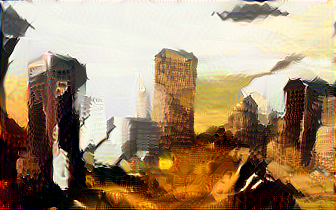

In [182]:
Image.open(path + 'results/lady_res_at_iteration_49.png')

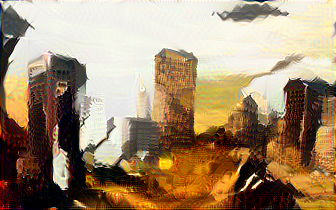

In [183]:
Image.open(path + 'results/lady_res_at_iteration_59.png')

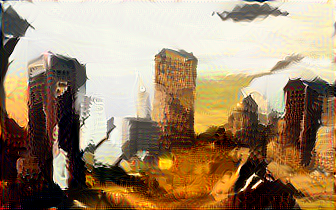

In [184]:
Image.open(path + 'results/lady_res_at_iteration_69.png')

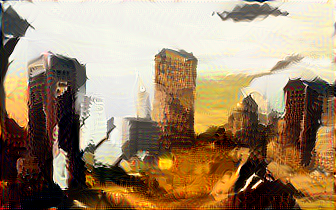

In [185]:
Image.open(path + 'results/lady_res_at_iteration_79.png')

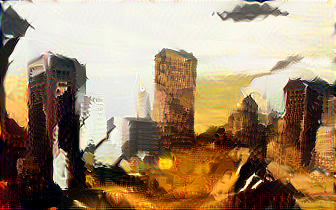

In [186]:
Image.open(path + 'results/lady_res_at_iteration_89.png')

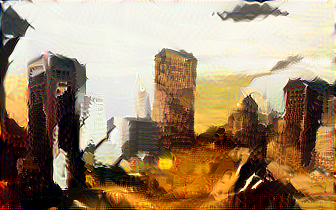

In [187]:
Image.open(path + 'results/lady_res_at_iteration_99.png')

In [188]:
Image.open(path + 'results/lady_res_at_iteration_109.png')

FileNotFoundError: [Errno 2] No such file or directory: '/home/ubuntu/courses/deeplearning2/data/ls8NeuralTrans/results/lady_res_at_iteration_109.png'

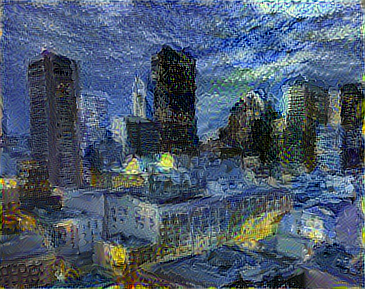

In [139]:
Image.open(path + 'results/res_at_iteration_19.png')

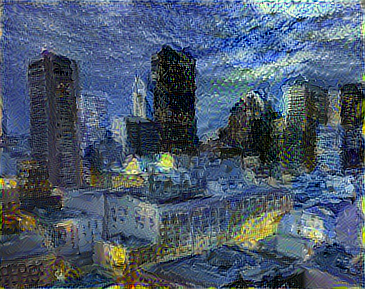

In [140]:
Image.open(path + 'results/res_at_iteration_29.png')

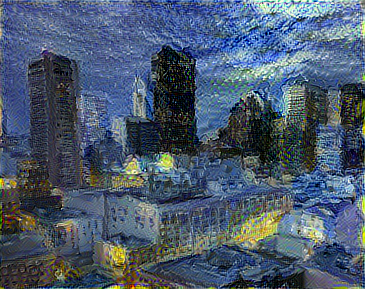

In [141]:
Image.open(path + 'results/res_at_iteration_39.png')

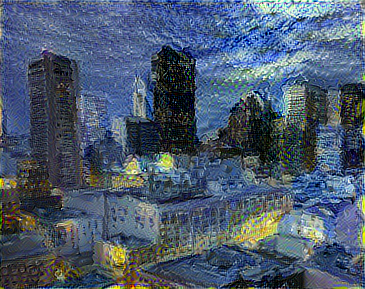

In [142]:
Image.open(path + 'results/res_at_iteration_49.png')

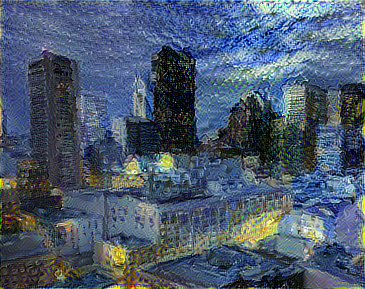

In [143]:
Image.open(path + 'results/res_at_iteration_59.png')

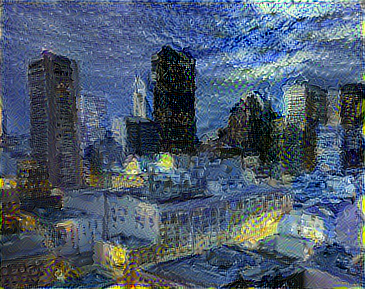

In [144]:
Image.open(path + 'results/res_at_iteration_69.png')

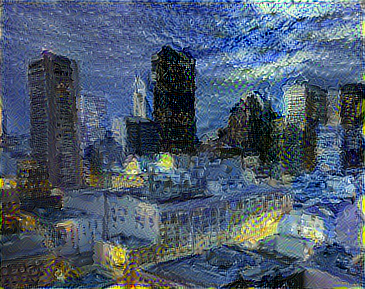

In [145]:
Image.open(path + 'results/res_at_iteration_79.png')

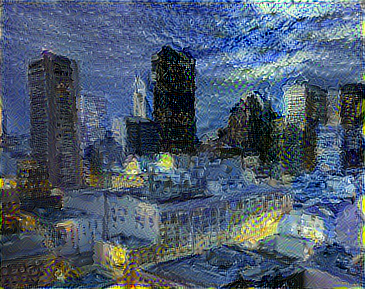

In [146]:
Image.open(path + 'results/res_at_iteration_89.png')

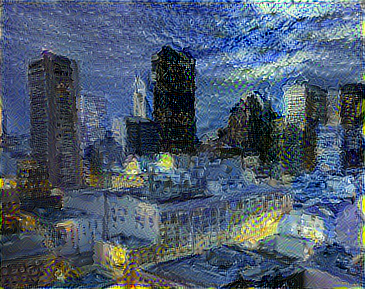

In [147]:
Image.open(path + 'results/res_at_iteration_99.png')

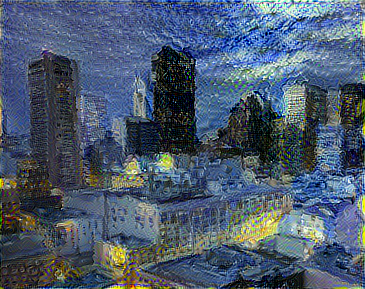

In [148]:
Image.open(path + 'results/res_at_iteration_110.png')

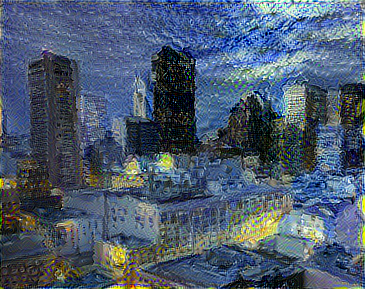

In [150]:
Image.open(path + 'results/res_at_iteration_119.png')

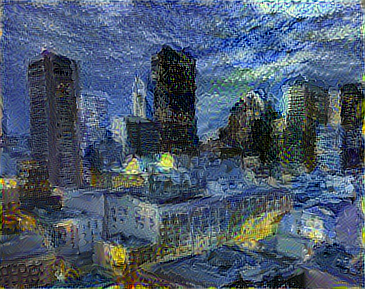

In [151]:
Image.open(path + 'results/res_at_iteration_19.png')

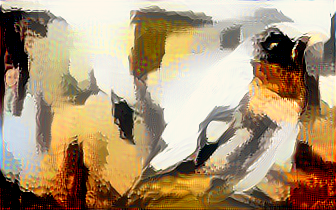

In [307]:
Image.open(path + 'results/res_at_iteration_9.png')

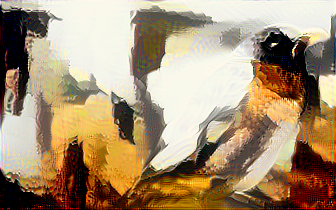

In [308]:
Image.open(path + 'results/res_at_iteration_19.png')

### Upsampling and Creating a high res image

In [4]:
current_dir = os.getcwd()

In [5]:
path = current_dir + '/data/upsample/'


In [6]:
arr_lr = bcolz.open(path+'trn_resized_72.bc')[:]
arr_hr = bcolz.open(path + 'trn_resized_288.bc')[:]

In [8]:
def conv_block(x,filters,size,stride=(2,2),mode='same',act=True): 
    x = Conv2D(filters,size,size,subsample=stride,border_mode=mode)(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x) if act else x

In [9]:
def res_block(ip, nf=64):
    x = conv_block(ip,nf,3,(1,1))
    x = conv_block(x,nf,3,(1,1),act=False)
    return merge([x,ip],mode='sum')                
    

In [10]:
def deconv_block(x,filters,size,stride=(2,2)):
    x = Deconv2D(filters,size,size,subsample=stride,border_mode='same', output =(None,)+ inp)(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x)

In [11]:
def up_block(x,filters,size):
    x = keras.layers.UpSampling2D()(x)
    x = Conv2D(filters,size,size,border_mode='same')(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x)

In [12]:
def get_model(arr):
    inp = Input(arr.shape[1:])
    x = conv_block(inp, 64 ,9,(1,1))
    for i in range(4): x = res_block(x)
    x = up_block(x,64,3)
    x = up_block(x,64,3)
    x = Conv2D(3,9,9,activation='tanh',border_mode='same')(x)
    out_p = Lambda(lambda x : (x+1)* 127.5)(x)
    return inp,out_p
    


In [13]:
inp,out_p = get_model(arr_lr)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (9, 9), strides=(1, 1), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), strides=(1, 1), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  after removing the cwd from sys.path.
/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/legacy/layers.py:458: UserWarning: The `Merge` layer is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  name=name)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Up

In [ ]:
out_hr = Model()

In [23]:
inp.shape

TensorShape([Dimension(None), Dimension(72), Dimension(72), Dimension(3)])

In [10]:
shp = arr_hr.shape[1:]
vgg_in = Input(shp)
vgg = VGG16_Avg(include_top=False, input_tensor=Lambda(preproc)(vgg_in))

NameError: name 'arr_hr' is not defined

In [17]:
for l in vgg.layers: l.trainable=False

In [31]:
#vgg_content = vgg_c.get_layer('block2_conv2').output

In [18]:
def get_output(m): return m.get_layer('block2_conv2').output
vgg_content = Model(vgg_in,get_output(vgg))
vgg1 = vgg_content(vgg_in)
vgg2 = vgg_content(out_p)

In [19]:
loss = Lambda(lambda x : K.sqrt(K.mean((x[0]-x[1])**2,(1,2))))([vgg1,vgg2])

In [20]:
m_final = Model([inp,vgg_in],loss)
targ = np.zeros((arr_hr.shape[0],128))

In [21]:
m_final.compile('adam','mse')

In [56]:
parms = {'verbose': 0, 'callbacks': [TQDMNotebookCallback(leave_inner=True)]}

In [25]:
m_final.fit([arr_lr,arr_hr],targ,8,2,**parms)

In [27]:
top_model =Model(inp,out_p)

In [44]:
p = top_model.predict(arr_lr[200:201])

In [37]:
p.shape

(1, 288, 288, 3)

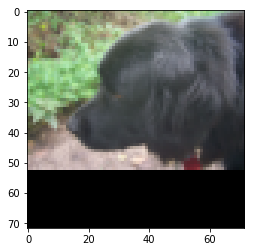

In [46]:
plt.imshow(arr_lr[200].astype('uint8'))

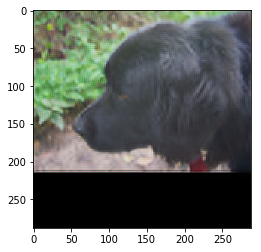

In [47]:
plt.imshow(p[0].astype('uint8'));

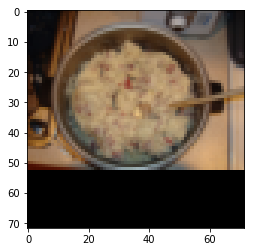

In [35]:
plt.imshow(arr_lr[11].astype('uint8'))

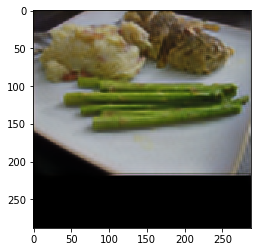

In [43]:
plt.imshow(p[0].astype('uint8'))

### Perceptual loss Neural Transfer

In [5]:
nPath = current_dir+'/data/train/';nPath

'/home/ubuntu/courses/deeplearning2/data/train/'

In [7]:
shp = arr_hr.shape[1:]; shp


(288, 288, 3)

In [8]:
input = Input(shp)


In [7]:
bc_arr = np.array(nPath)

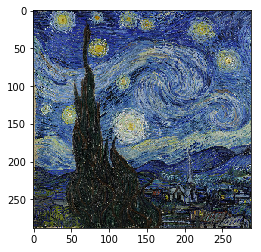

In [9]:
style_img = Image.open(current_dir+'/data/ls8NeuralTrans/starry_night.jpg')
style= style_img.resize(np.divide(style_img.size,3.5).astype('int32'))
style = np.array(style)[:shp[0], :shp[1], :shp[2]]
plt.imshow(style)

In [222]:
style.shape

(288, 288, 3)

In [10]:
class ReflectionPadding2D(Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        self.input_spec = [InputSpec(ndim=4)]
        super(ReflectionPadding2D, self).__init__(**kwargs)
        
    def get_output_shape_for(self, s):
        return (s[0], s[1] + 2 * self.padding[0], s[2] + 2 * self.padding[1], s[3])

    def call(self, x, mask=None):
        w_pad,h_pad = self.padding
        return tf.pad(x, [[0,0], [h_pad,h_pad], [w_pad,w_pad], [0,0] ], 'REFLECT')
    

In [11]:
def up_jblock(x, filters, size):
    x = keras.layers.UpSampling2D()(x)
    x = Conv2D(filters, size, size, border_mode='same')(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x)

In [32]:
def conv_block(x, filters, size, stride, mode='same', act=True):
    x =Conv2D(filters, size, size, subsample=stride, border_mode=mode)(x)
    #x = BatchNormalization(mode=0)(x)
    return Activation('relu')(x) if act else x
    

In [36]:
def up_block(x, filters, size):
    x = keras.layers.UpSampling2D()(x)
    x = Conv2D(filters, size, size, border_mode='same')(x)
    #x = BatchNormalization()(x)
    return Activation('relu')(x)

In [40]:
def res_block(ip, nf=64):
    x = conv_block(ip, nf, 3, (1,1), 'valid')
    x = conv_block(x,  nf, 3, (1,1), 'valid', False)
    ip = Lambda(lambda x: x[:, 2:-2, 2:-2])(ip)
    return concatenate([x, ip])

In [41]:
def deconv_block(x,filters,size,stride=(2,2)):
    x = Conv2DTranspose(filters,size,size,subsample=stride,border_mode='valid')(x)
    x = BatchNormalization()(x)
    return Activation('relu')(x)

In [42]:
inp=Input(shp)
print(inp.shape)
x=ReflectionPadding2D((40, 40))(inp)
print(x.shape)
x=conv_block(x, 64, 9, (1,1))
print(x.shape)
x=conv_block(x, 64, 3,(2,2))
print(x.shape)
x=conv_block(x, 64, 3,(2,2))
print(x.shape)
for i in range(5): x=res_block(x)
print(x.shape)
x=up_block(x, 64, 3)
print(x.shape)
x=up_block(x, 64, 3)
print(x.shape)
x=Convolution2D(3, 9, 9, activation='tanh', border_mode='same')(x)
print(x.shape)
outp=Lambda(lambda x: (x+1)*127.5)(x)

(?, 288, 288, 3)
(?, 368, 368, 3)
(?, 368, 368, 64)
(?, 184, 184, 64)
(?, 92, 92, 64)
(?, 72, 72, 384)
(?, 104, 104, 64)
(?, 208, 208, 64)
(?, 208, 208, 3)


/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/engine/topology.py:624: UserWarning: Class `__main__.ReflectionPadding2D` defines `get_output_shape_for` but does not override `compute_output_shape`. If this is a Keras 1 layer, please implement `compute_output_shape` to support Keras 2.
  output_shape = self.compute_output_shape(input_shape)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (9, 9), strides=(1, 1), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), strides=(2, 2), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), strides=(1, 1), padding="valid")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3

In [38]:
def get_nn_model(arr):
    inp =Input(arr.shape[1:])
    x = ReflectionPadding2D((40,40))(inp)
    x = conv_block(x,64,9,)
    x = conv_block(x,64,3,stride=(2,2))
    x =conv_block(x,64,3,stride=(2,2))
    for i in range(5): res_block(x)
    x = up_block(x,64,3)
    x = up_block(x,64,3)
    x =Conv2D(3,9,9,activation='tanh',border_mode='same')(x)
    out_nn = Lambda(lambda x : (x+1)*127.5)(x)
    return inp, out_nn

In [39]:
inp, out_nn = get_nn_model(arr_hr)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/engine/topology.py:624: UserWarning: Class `__main__.ReflectionPadding2D` defines `get_output_shape_for` but does not override `compute_output_shape`. If this is a Keras 1 layer, please implement `compute_output_shape` to support Keras 2.
  output_shape = self.compute_output_shape(input_shape)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (9, 9), strides=(2, 2), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), strides=(1, 1), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), strides=(2, 2), padding="same")`
  
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2:

In [40]:
shp

(288, 288, 3)

In [19]:
outp.shape

TensorShape([Dimension(None), Dimension(208), Dimension(208), Dimension(3)])

In [20]:
vgg_in = Input(shp)

In [21]:
vgg =VGG16(include_top =False, input_tensor = Lambda(preproc)(vgg_in))
for l in vgg.layers: l.trainable=False

In [22]:
def get_cout(m,ln): return m.get_layer(f'block{ln}_conv2').output

In [23]:
vgg_content = Model(vgg_in,[get_cout(vgg,o) for o in [2,3,4,5]])

In [24]:
vgg1 = vgg_content(vgg_in)
vgg2 = vgg_content(outp)

In [25]:
vgg2

[<tf.Tensor 'model_1_1/block2_conv2/Relu:0' shape=(?, 104, 104, 128) dtype=float32>,
 <tf.Tensor 'model_1_1/block3_conv2/Relu:0' shape=(?, 52, 52, 256) dtype=float32>,
 <tf.Tensor 'model_1_1/block4_conv2/Relu:0' shape=(?, 26, 26, 512) dtype=float32>,
 <tf.Tensor 'model_1_1/block5_conv2/Relu:0' shape=(?, 13, 13, 512) dtype=float32>]

In [26]:
style_targs = [K.variable(o) for o in vgg_content.predict(np.expand_dims(style,0))]

In [27]:
[K.eval(K.shape(o)) for o in style_targs]

[array([  1, 144, 144, 128], dtype=int32),
 array([  1,  72,  72, 256], dtype=int32),
 array([  1,  36,  36, 512], dtype=int32),
 array([  1,  18,  18, 512], dtype=int32)]

In [28]:
def mean_sqr_b(diff): 
    dims = list(range(1,K.ndim(diff)))
    return K.expand_dims(K.sqrt(K.mean(diff**2, dims)), 0)

In [29]:
def gram_matrix_b(x):
    x = K.permute_dimensions(x, (0, 3, 1, 2))
    s = K.shape(x)
    feat = K.reshape(x, (s[0], s[1], s[2]*s[3]))
    return K.batch_dot(feat, K.permute_dimensions(feat, (0, 2, 1))
                      ) / K.prod(K.cast(s[1:], K.floatx()))


In [30]:
w=[0.1, 0.2, 0.6, 0.1]
def tot_loss(x):
    loss = 0; n = len(style_targs)
    for i in range(n):
        loss += mean_sqr_b(gram_matrix_b(x[i+n]) - gram_matrix_b(style_targs[i])) / 2.
        loss += mean_sqr_b(x[i]-x[i+n]) * w[i]
    return loss

In [31]:
loss = Lambda(tot_loss)(vgg1+vgg2)
m__fn = Model([inp,vgg_in],loss)


ValueError: Dimensions must be equal, but are 144 and 104 for 'lambda_9/sub_1' (op: 'Sub') with input shapes: [?,144,144,128], [?,104,104,128].

In [54]:
targ = np.zeros((arr_hr.shape[0],1))

In [57]:
m__fn.compile('adam','mae')
m__fn.fit([arr_hr,arr_hr],targ,8,2, **parms)

InvalidArgumentError: Incompatible shapes: [8,144,144,128] vs. [8,184,184,128]
	 [[Node: lambda_22/sub_1 = Sub[T=DT_FLOAT, _device="/job:localhost/replica:0/task:0/gpu:0"](model_2/block2_conv2/Relu, model_2_1/block2_conv2/Relu)]]
	 [[Node: lambda_22/Cast_2/_1143 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_826_lambda_22/Cast_2", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]

Caused by op 'lambda_22/sub_1', defined at:
  File "/home/ubuntu/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/ubuntu/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start
    self.io_loop.start()
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tornado/ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tornado/stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 281, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 232, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 397, in execute_request
    user_expressions, allow_stdin)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 533, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2728, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2850, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2910, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-53-d95485edfc06>", line 1, in <module>
    loss = Lambda(tot_loss)(vgg1+vgg2)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/engine/topology.py", line 605, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/keras/layers/core.py", line 651, in call
    return self.function(inputs, **arguments)
  File "<ipython-input-52-db5dbc378ffa>", line 6, in tot_loss
    loss += mean_sqr_b(x[i]-x[i+n]) * w[i]
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/math_ops.py", line 794, in binary_op_wrapper
    return func(x, y, name=name)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/gen_math_ops.py", line 2775, in _sub
    result = _op_def_lib.apply_op("Sub", x=x, y=y, name=name)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 763, in apply_op
    op_def=op_def)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 2327, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1226, in __init__
    self._traceback = _extract_stack()

InvalidArgumentError (see above for traceback): Incompatible shapes: [8,144,144,128] vs. [8,184,184,128]
	 [[Node: lambda_22/sub_1 = Sub[T=DT_FLOAT, _device="/job:localhost/replica:0/task:0/gpu:0"](model_2/block2_conv2/Relu, model_2_1/block2_conv2/Relu)]]
	 [[Node: lambda_22/Cast_2/_1143 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/cpu:0", send_device="/job:localhost/replica:0/task:0/gpu:0", send_device_incarnation=1, tensor_name="edge_826_lambda_22/Cast_2", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/cpu:0"]()]]


In [92]:
K.set_value(m__fn.optimizer.lr,1e-4)
m__fn.fit([arr_hr,arr_hr],targ,16,1,**parms)

In [104]:
top_model =Model(inp,out_nn)

In [107]:
top_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 288, 288, 3)       0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 288, 288, 64)      15616     
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 144, 144, 64)      36928     
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 72, 72, 64)        36928     
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 144, 144, 64)      0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 144, 144, 64)      36928     
_________________________________________________________________
batch_normalization_27 (Batc (None, 144, 144, 64)      256       
__________

In [105]:
ol = top_model.predict(arr_hr[:222])

In [100]:
qqp.shape

(222, 288, 288, 3)

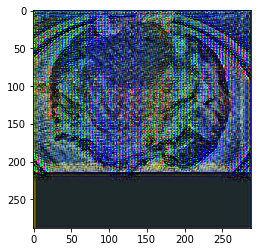

In [106]:
plt.imshow(np.round(ol[1]).astype(np.uint8))